In [10]:
import pandas as pd
from bifacial_peak_shaving import *
from utils import *
pd.options.plotting.backend='plotly'

# Data

In [11]:
dir = './Data/'

## Load

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8760 entries, 2019-01-01 00:00:00 to 2019-12-31 23:00:00
Freq: H
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Load (kW)  8760 non-null   float64
dtypes: float64(1)
memory usage: 136.9 KB
None
         Load (kW)
count  8760.000000
mean    152.835907
std      32.911460
min       0.000000
25%     125.940000
50%     151.560000
75%     179.100000
max     257.220000


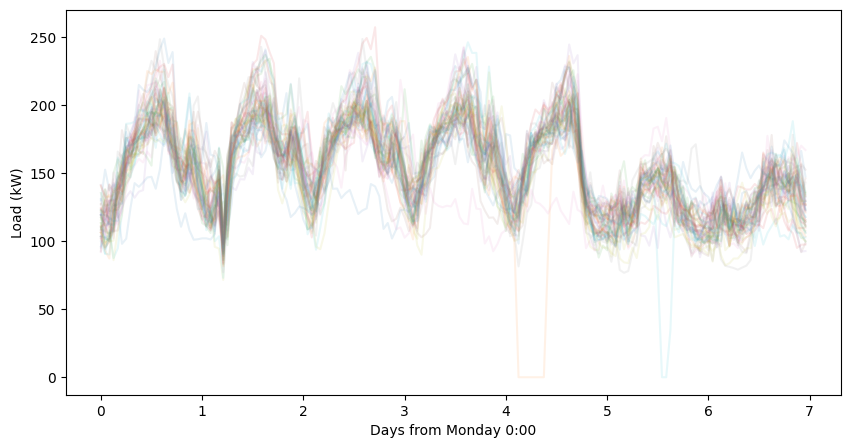

In [16]:
load = pd.read_csv(dir+'Oregon Food Bank.csv',
                   index_col=0,
                   parse_dates=True,
                   comment='#').loc['2019'].resample('1h').mean()
print(load.info())
print(load.describe())

plot_weekly(load['Load (kW)'],interval_min=60,alpha=0.1)

load.plot()

## Solar

- 7 kWp, TMY

- Net zero capacity

  - $capacity[kWp] = production[kWh] \times yield [\frac{kWh}{kWp}]^{-1}$

In [17]:
solar_angles = ['s20','w20','w90','s20w90']
solar = pd.concat(( 
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_s20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w90deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_3.5kwp_s20deg_3.5kwp_w90deg.csv',index_col=0),
                   ),
                  axis=1)
solar.index = pd.date_range('1900-1-1 0:00',periods=8760,freq='1h')
solar.columns = solar_angles
net_zero_capacity = load['Load (kW)'].sum() / (solar.s20.sum()/7) # load=production / yield
solar = solar * net_zero_capacity/7 # scale to net 0
#solar = solar * 2 # randomly scale up
solar.describe()

,s20,w20,w90,s20w90
count,8760.000000,8760.000000,8760.000000,8760.000000
mean,152.835907,136.625476,146.168436,149.626268
std,215.786774,192.832875,192.150634,190.557633
min,-0.531721,-0.531721,-0.484591,-0.444729
25%,-0.062899,-0.062899,-0.062899,-0.062899
50%,-0.062899,-0.062899,-0.062899,-0.062899
75%,302.199198,267.847926,281.520850,322.509901
max,872.011368,840.112950,736.229719,677.504188


In [18]:
# for col in solar:
#     plot_daily(solar[col],title=col,interval_min=60)

## Plot weekly

In [19]:
solar.index = load.index
df = pd.concat((load,solar),axis=1)
df.columns = ['load'] + ['solar_'+x for x in solar.columns]
for angle in solar.columns:
    df[f'netload_{angle}'] = df['load'] - solar[angle]
df    

,load,solar_s20,solar_w20,solar_w90,solar_s20w90,netload_s20,netload_w20,netload_w90,netload_s20w90
Datetime PST,,,,,,,,,
2019-01-01 00:00:00,111.96,-0.062899,-0.062899,-0.062899,-0.062899,112.022899,112.022899,112.022899,112.022899
2019-01-01 01:00:00,150.48,-0.062899,-0.062899,-0.062899,-0.062899,150.542899,150.542899,150.542899,150.542899
2019-01-01 02:00:00,131.16,-0.062899,-0.062899,-0.062899,-0.062899,131.222899,131.222899,131.222899,131.222899
2019-01-01 03:00:00,145.20,-0.062899,-0.062899,-0.062899,-0.062899,145.262899,145.262899,145.262899,145.262899
2019-01-01 04:00:00,130.98,-0.062899,-0.062899,-0.062899,-0.062899,131.042899,131.042899,131.042899,131.042899
...,...,...,...,...,...,...,...,...,...
2019-12-31 19:00:00,130.86,-0.062899,-0.062899,-0.062899,-0.062899,130.922899,130.922899,130.922899,130.922899
2019-12-31 20:00:00,126.00,-0.062899,-0.062899,-0.062899,-0.062899,126.062899,126.062899,126.062899,126.062899
2019-12-31 21:00:00,121.74,-0.062899,-0.062899,-0.062899,-0.062899,121.802899,121.802899,121.802899,121.802899


load v s20

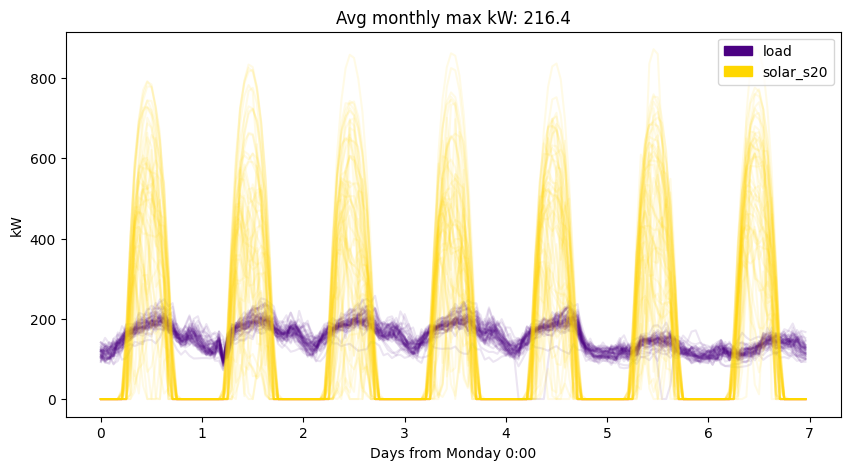

In [20]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

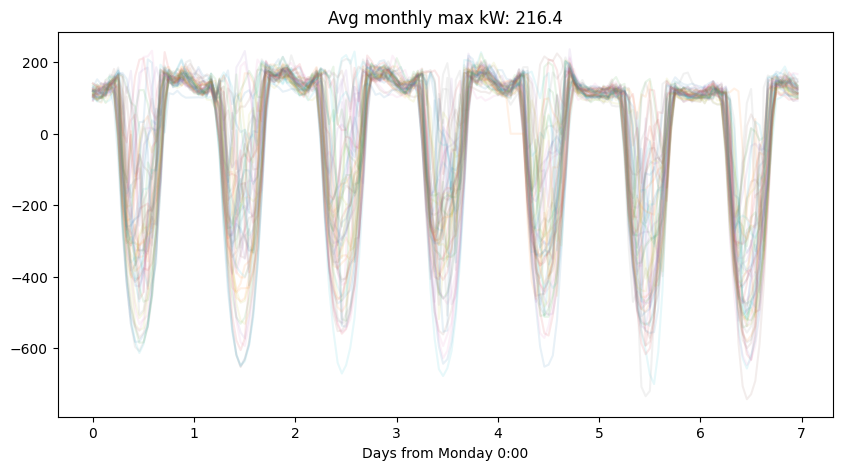

In [21]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w20

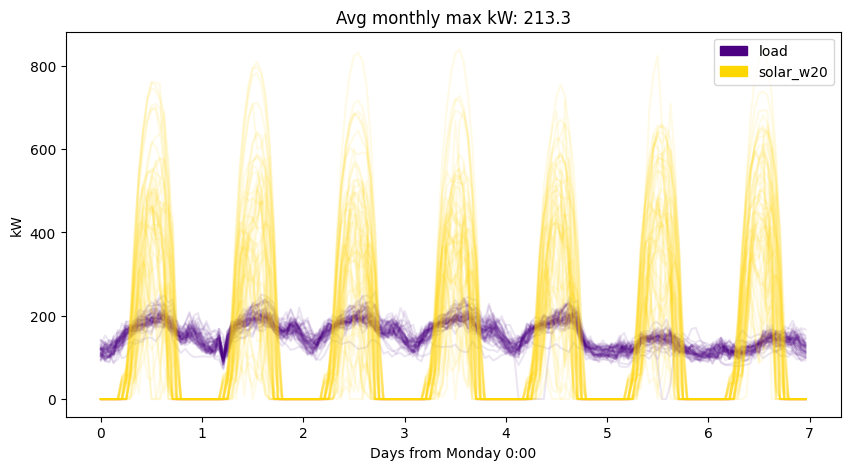

In [22]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

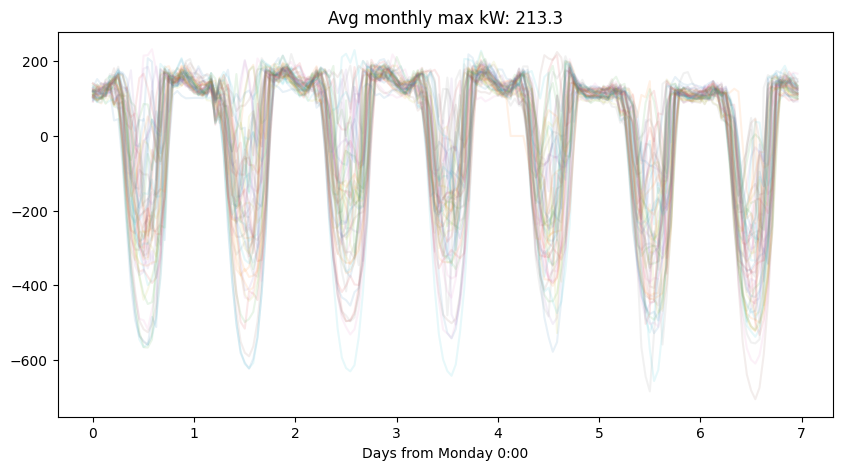

In [23]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w90

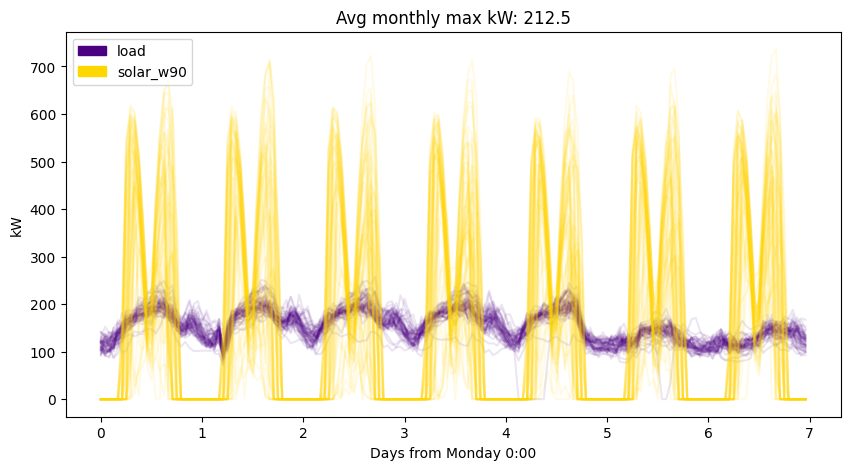

In [24]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

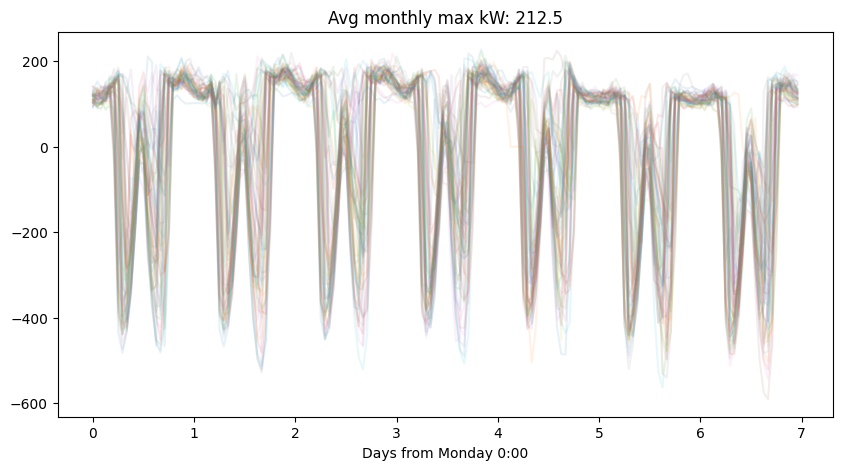

In [25]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v s20w90

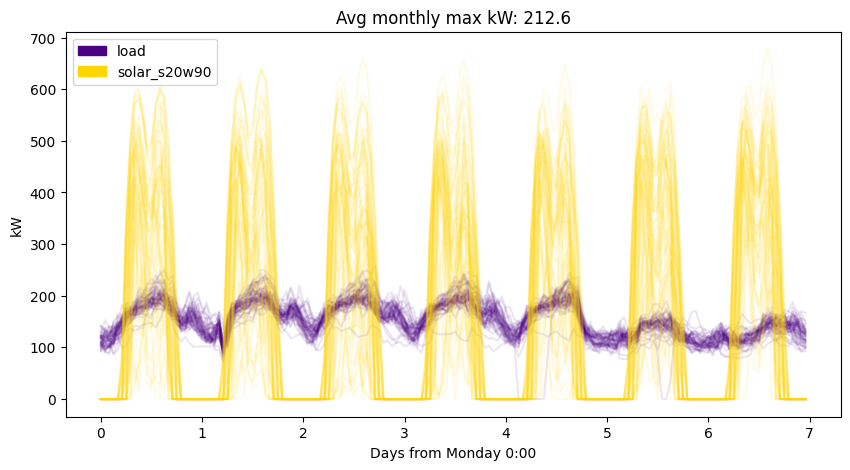

In [26]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

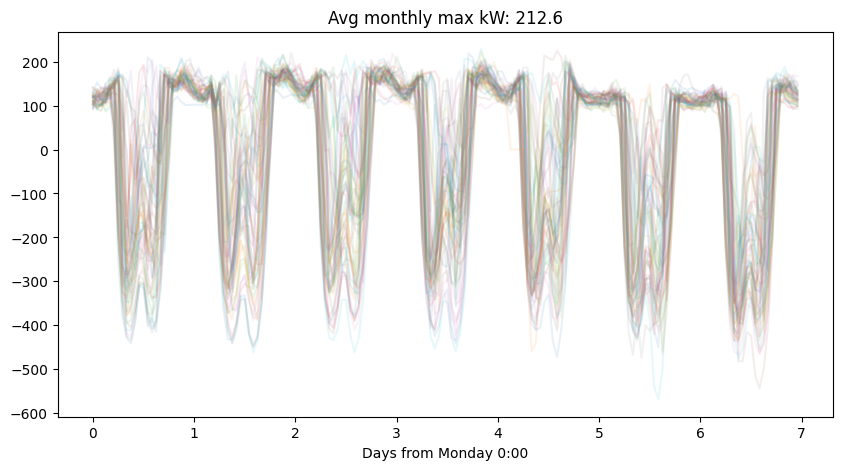

In [27]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

# Monthly peaks

## Single TOU

In [30]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)

angle = 'w20'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 'w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 's20w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

print('Avg w20 reduction',peaks['netload_s20->w20 reduc kw'].mean())
print('Avg w90 reduction',peaks['netload_s20->w90 reduc kw'].mean())
print('Avg s20w90 reduction',peaks['netload_s20->s20w90 reduc kw'].mean())
peaks

Avg w20 reduction 22.05
Avg w90 reduction 36.050000000000004
Avg s20w90 reduction 24.866666666666664


,netload_s20 kw,netload_s20 t,netload_w20 kw,netload_w20 t,netload_s20->w20 reduc kw,netload_w90 kw,netload_w90 t,netload_s20->w90 reduc kw,netload_s20w90 kw,netload_s20w90 t,netload_s20->s20w90 reduc kw
1,177.4,2019-01-31 09:00:00,177.4,2019-01-31 09:00:00,0.0,180.1,2019-01-31 09:00:00,-2.7,178.7,2019-01-31 09:00:00,-1.3
2,176.9,2019-02-06 08:00:00,176.9,2019-02-06 08:00:00,0.0,176.9,2019-02-06 08:00:00,0.0,176.9,2019-02-06 08:00:00,0.0
3,67.1,2019-03-09 08:00:00,80.1,2019-03-01 08:00:00,-13.0,79.7,2019-03-09 08:00:00,-12.6,73.4,2019-03-09 08:00:00,-6.3
4,152.5,2019-04-17 08:00:00,152.5,2019-04-17 08:00:00,0.0,158.9,2019-04-17 08:00:00,-6.4,155.7,2019-04-17 08:00:00,-3.2
5,97.5,2019-05-30 10:00:00,94.2,2019-05-17 08:00:00,3.3,109.8,2019-05-17 08:00:00,-12.3,101.7,2019-05-17 08:00:00,-4.2
6,-37.4,2019-06-14 10:00:00,-65.0,2019-06-28 08:00:00,27.6,-18.5,2019-06-28 10:00:00,-18.9,-51.1,2019-06-14 10:00:00,13.7
7,194.0,2019-07-05 10:00:00,163.2,2019-07-05 10:00:00,30.8,6.4,2019-07-05 10:00:00,187.6,102.4,2019-07-05 10:00:00,91.6
8,161.0,2019-08-26 10:00:00,71.9,2019-08-21 09:00:00,89.1,84.1,2019-08-21 09:00:00,76.9,75.2,2019-08-21 09:00:00,85.8
9,186.1,2019-09-03 10:00:00,59.3,2019-09-03 10:00:00,126.8,-37.7,2019-09-25 10:00:00,223.8,63.7,2019-09-03 10:00:00,122.4
10,187.9,2019-10-30 09:00:00,187.9,2019-10-30 09:00:00,0.0,187.9,2019-10-30 09:00:00,0.0,187.9,2019-10-30 09:00:00,0.0


## Variable TOU

w20

In [31]:
angle1 = 's20'
angle2 = 'w20'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
1,8,11,126.8,22.0,-13.0
2,8,12,56.0,11.6,-13.0
3,8,13,36.8,5.8,-13.0
4,8,14,28.0,0.7,-16.5
7,8,17,28.0,1.4,-16.5
...,...,...,...,...,...
71,16,21,34.1,3.4,0.0
72,17,19,78.8,11.7,0.0
73,17,20,34.1,5.7,0.0
74,17,21,34.1,3.2,0.0


w90

In [32]:
angle1 = 's20'
angle2 = 'w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
0,8,10,134.2,18.1,-17.8
1,8,11,223.8,36.1,-18.9
2,8,12,73.0,2.3,-82.2
3,8,13,70.9,5.1,-21.0
4,8,14,70.9,5.1,-21.0
...,...,...,...,...,...
71,16,21,36.9,4.2,0.0
72,17,19,81.1,14.4,0.0
73,17,20,36.9,6.4,0.0
74,17,21,36.9,3.9,0.0


s20w90

In [33]:
angle1 = 's20'
angle2 = 's20w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
0,8,10,111.1,19.1,-8.9
1,8,11,122.4,24.9,-6.3
2,8,12,35.8,2.1,-27.0
3,8,13,33.0,2.8,-6.7
4,8,14,33.0,2.8,-6.7
...,...,...,...,...,...
71,16,21,36.9,3.7,0.0
72,17,19,76.1,13.6,0.0
73,17,20,36.9,6.0,0.0
74,17,21,36.9,3.5,0.0


Best for w90

In [34]:
#df.loc['2022-6-28':'2022-6-30'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

In [35]:
#df.loc['2022-3-5':'2022-3-7'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

Largest spread w90 v s20w90

In [36]:
#df.loc['2022-10-12':'2022-10-14'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

# Peak shaving

## Technical

More or less technical peak shaving doesn't benefit from bifacial, I think because if you're trying to shave the entire day you benefit more from the greater kWh produced by s20 than any of the other angles.

### Single angle

In [38]:
angle = 's20'
threshold = 200
batt_kwh_max = 500
tou_h = list(range(24))

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {tou_h[0]}-{tou_h[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Solution found: netload_s20, Threshold kw = 200.0, Battery kWh = 72.0,


### Several angles

In [39]:
threshold = 200
batt_kwh_max = 100
TOU_hours = list(range(24))

results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            TOU_hours)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

Solution found: netload_s20, Threshold kw = 200.0, Battery kWh = 72.0,
Solution found: netload_w20, Threshold kw = 200.0, Battery kWh = 72.0,
Solution found: netload_w90, Threshold kw = 200.0, Battery kWh = 60.0,
Solution found: netload_s20w90, Threshold kw = 200.0, Battery kWh = 68.0,


,batt_kwh,dispatch
s20,72,load solar_s20 solar_...
w20,72,load solar_s20 solar_...
w90,60,load solar_s20 solar_...
s20w90,68,load solar_s20 solar_...


s20

In [40]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [41]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

## Economic

### Single angle

In [43]:
threshold = 0
batt_kwh_max = 5000
angle = 's20'
tou_h = list(range(16,21))

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,step=10)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {tou_h[0]}-{tou_h[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Solution found: netload_s20, Threshold kw = 0.0, Battery kWh = 3550.0,


### Several angles

In [45]:
threshold = 0
batt_kwh_max = 5000
tou_h = list(range(16,21))

results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            tou_h,
                                            step=10)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

Solution found: netload_s20, Threshold kw = 0.0, Battery kWh = 3550.0,
Failed on first battery size, try 1.1x
Solution found: netload_w20, Threshold kw = 0.0, Battery kWh = 5420.0,
Failed on first battery size, try 1.1x
Failed on first battery size, try 2x
Solution found: netload_w90, Threshold kw = 0.0, Battery kWh = 6040.0,
Solution found: netload_s20w90, Threshold kw = 0.0, Battery kWh = 3980.0,


,batt_kwh,dispatch
s20,3550,load solar_s20 solar_...
w20,5420,load solar_s20 solar_...
w90,6040,load solar_s20 solar_...
s20w90,3980,load solar_s20 solar_...


s20

In [46]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {tou_h[0]}:00-{1+tou_h[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [47]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {tou_h[0]}:00-{1+tou_h[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')